In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/uk-energy-consumption-2015-a-to-l/Postcode_level_standard_electricity_2015_A_to_L.csv
/kaggle/input/uk-energy-consumption-2015-a-to-l/codepo_gb.gpkg


# Libraries

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
geos_capi_version_string = "3.9.1-CAPI-1.14.2"
import pygeos as pg
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings; warnings.filterwarnings("ignore")

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# Reading Files

### Reading the Energy Consumption data

In [3]:
energy_data = pd.read_csv("../input/uk-energy-consumption-2015-a-to-l/Postcode_level_standard_electricity_2015_A_to_L.csv")
energy_data.head()

,POSTCODE,Number of meters,Consumption (kWh),Mean consumption (kWh),Median consumption (kWh)
0,AB10,188,744918.3,3962.331383,3189.9
1,AB10 1AU,24,44997.1,1874.879167,1507.7
2,AB10 1BA,29,61458.4,2119.255172,1832.3
3,AB10 1BB,6,16915.9,2819.316667,2216.2
4,AB10 1FG,25,68685.4,2747.416000,2110.3


### Reading the GeoPackage data

In [4]:
geo_data = gpd.read_file("../input/uk-energy-consumption-2015-a-to-l/codepo_gb.gpkg")
geo_data.head()

,Postcode,Positional_quality_indicator,Country_code,NHS_regional_HA_code,NHS_HA_code,Admin_county_code,Admin_district_code,Admin_ward_code,geometry
0,AB101AB,10,S92000003,None,S08000020,None,S12000033,S13002842,POINT (394235.000 806529.000)
1,AB101AF,10,S92000003,None,S08000020,None,S12000033,S13002842,POINT (394235.000 806529.000)
2,AB101AG,10,S92000003,None,S08000020,None,S12000033,S13002842,POINT (394230.000 806469.000)
3,AB101AH,10,S92000003,None,S08000020,None,S12000033,S13002842,POINT (394235.000 806529.000)
4,AB101AL,10,S92000003,None,S08000020,None,S12000033,S13002842,POINT (394296.000 806581.000)


In [5]:
geo_data = geo_data.loc[ : , ["Postcode", "geometry"]]
geo_data.head()

,Postcode,geometry
0,AB101AB,POINT (394235.000 806529.000)
1,AB101AF,POINT (394235.000 806529.000)
2,AB101AG,POINT (394230.000 806469.000)
3,AB101AH,POINT (394235.000 806529.000)
4,AB101AL,POINT (394296.000 806581.000)


# Quick-peek of the data

Getting the names of the columns at one place.

In [6]:
energy_data.columns

Index(['POSTCODE', 'Number of meters', 'Consumption (kWh)',
       'Mean consumption (kWh)', 'Median consumption (kWh)'],
      dtype='object')

The names of these columns can prove to be troublesome in the future.
So we are going to filter these names so that it can be more user friendly.

In [7]:
cols = ["postcode", "meters", "consumption", "mean_consumption", "median_consumption"]
energy_data.columns = cols
energy_data.columns

Index(['postcode', 'meters', 'consumption', 'mean_consumption',
       'median_consumption'],
      dtype='object')

In the near future, we can set the <code>postcode</code> column as index. So we are going to do the same with <code>geo_data</code>

In [8]:
cols = ["postcode", "geometry"]
geo_data.columns = cols
geo_data.columns

Index(['postcode', 'geometry'], dtype='object')

In [9]:
energy_data.describe()

,meters,consumption,mean_consumption,median_consumption
count,500000.000000,5.000000e+05,500000.000000,500000.000000
mean,20.045374,7.465931e+04,3873.196881,3378.980404
std,20.701516,9.902826e+04,1520.443420,1279.987693
min,5.000000,8.028000e+02,133.800000,122.700000
25%,9.000000,3.549928e+04,2986.938511,2594.800000
50%,16.000000,5.976395e+04,3623.940357,3205.400000
75%,26.000000,9.577095e+04,4400.229762,3904.350000
max,1223.000000,8.066671e+06,49878.462500,56020.750000


# Merging the Datasets

Merging by setting index as <code>postcode</code> column.

In [10]:
merged = energy_data.set_index("postcode").join(geo_data.set_index("postcode"))
merged.head()

,meters,consumption,mean_consumption,median_consumption,geometry
postcode,,,,,
AB10,188,744918.3,3962.331383,3189.9,None
AB10 1AU,24,44997.1,1874.879167,1507.7,None
AB10 1BA,29,61458.4,2119.255172,1832.3,None
AB10 1BB,6,16915.9,2819.316667,2216.2,None
AB10 1FG,25,68685.4,2747.416000,2110.3,None


We don't have the co-ordinates in the dataset.<br>
But we need them in order to perform EDA.

# Experimenting and Getting the Co-ordinates

I'm thankful to [Giles McMullen-Klein](https://www.youtube.com/c/FlickThrough/about). His videos helped me getting this co-ordinates.

Dropping down rows having entry as <code>None</code> and creating columns.

In [11]:
merged.drop(merged[merged["geometry"] == None].index, inplace = True)
merged["eastings"] = 0
merged["northings"] = 0
merged.head()

,meters,consumption,mean_consumption,median_consumption,geometry,eastings,northings
postcode,,,,,,,
AL1 1AJ,50,146369.9,2927.398000,2557.80,POINT (515491.000 206410.000),0,0
AL1 1AR,21,51268.8,2441.371429,2226.80,POINT (516270.000 205897.000),0,0
AL1 1AS,13,42842.1,3295.546154,2712.80,POINT (515005.000 206908.000),0,0
AL1 1AT,8,30174.6,3771.825000,4238.25,POINT (516131.000 206148.000),0,0
AL1 1BX,16,81580.8,5098.800000,4680.40,POINT (514621.000 206900.000),0,0


### Experimenting

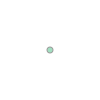

In [12]:
merged.geometry.loc["AL1 1AJ"]

In [13]:
print(merged.geometry.loc["AL1 1AJ"])
print(merged.geometry.loc["AL1 1AJ"].x, merged.geometry.loc["AL1 1AJ"].y)

POINT (515491 206410)
515491.0 206410.0


In [14]:
merged["eastings"] = merged.apply(
           lambda row : (row["geometry"].x), axis = 1)
merged["northings"] = merged.apply(
           lambda row : (row["geometry"].y), axis = 1)
merged.head()

,meters,consumption,mean_consumption,median_consumption,geometry,eastings,northings
postcode,,,,,,,
AL1 1AJ,50,146369.9,2927.398000,2557.80,POINT (515491.000 206410.000),515491.0,206410.0
AL1 1AR,21,51268.8,2441.371429,2226.80,POINT (516270.000 205897.000),516270.0,205897.0
AL1 1AS,13,42842.1,3295.546154,2712.80,POINT (515005.000 206908.000),515005.0,206908.0
AL1 1AT,8,30174.6,3771.825000,4238.25,POINT (516131.000 206148.000),516131.0,206148.0
AL1 1BX,16,81580.8,5098.800000,4680.40,POINT (514621.000 206900.000),514621.0,206900.0


Voila! We got the co-ordinates.

# Getting the Lat and Lon

In [15]:
# webscrapping.com
from pyproj import Proj, transform

v84 = Proj(proj="latlong",towgs84="0,0,0",ellps="WGS84")
v36 = Proj(proj="latlong", k=0.9996012717, ellps="airy",
        towgs84="446.448,-125.157,542.060,0.1502,0.2470,0.8421,-20.4894")
vgrid = Proj(init="world:bng")

def ENtoLL84(df):
    """ (longitude, latitude) tuple
    """
    vlon36, vlat36 = vgrid(df["eastings"].values, df["northings"].values, inverse=True)
    converted = transform(v36, v84, vlon36, vlat36)
    df["longitude"] = converted[0]
    df["latitude"] = converted[1]
    return df

ENtoLL84(merged)

merged.head()

,meters,consumption,mean_consumption,median_consumption,geometry,eastings,northings,longitude,latitude
postcode,,,,,,,,,
AL1 1AJ,50,146369.9,2927.398000,2557.80,POINT (515491.000 206410.000),515491.0,206410.0,-0.328599,51.744498
AL1 1AR,21,51268.8,2441.371429,2226.80,POINT (516270.000 205897.000),516270.0,205897.0,-0.317492,51.739727
AL1 1AS,13,42842.1,3295.546154,2712.80,POINT (515005.000 206908.000),515005.0,206908.0,-0.335471,51.749073
AL1 1AT,8,30174.6,3771.825000,4238.25,POINT (516131.000 206148.000),516131.0,206148.0,-0.319421,51.742011
AL1 1BX,16,81580.8,5098.800000,4680.40,POINT (514621.000 206900.000),514621.0,206900.0,-0.341033,51.749080


In [16]:
merged = merged.drop(columns = ["meters", "consumption", "geometry", "northings", "eastings"])

In [17]:
merged = merged.reset_index()
merged.head()

,postcode,mean_consumption,median_consumption,longitude,latitude
0,AL1 1AJ,2927.398000,2557.80,-0.328599,51.744498
1,AL1 1AR,2441.371429,2226.80,-0.317492,51.739727
2,AL1 1AS,3295.546154,2712.80,-0.335471,51.749073
3,AL1 1AT,3771.825000,4238.25,-0.319421,51.742011
4,AL1 1BX,5098.800000,4680.40,-0.341033,51.749080


# Plotting into MapBox

Don't forget to interact with the map. It's soo cute!!

In [18]:
px.scatter_mapbox(merged,
                  lat = "latitude",
                  lon = "longitude",
                  color = "median_consumption",
                  mapbox_style = "open-street-map",
                  hover_name = "postcode",
                  hover_data = ["median_consumption"])

In [19]:
print("The Median Consumption per year :", merged["median_consumption"].median())
print("The top percentile of the energy consumption :", merged["median_consumption"].quantile(0.99))

The Median Consumption per year : 3184.8
The top percentile of the energy consumption : 7672.071000000003


### Plotting only the high energy consumption

In [20]:
high_consumption = merged[merged["median_consumption"] > merged["median_consumption"].quantile(0.99)]
high_consumption.head()

,postcode,mean_consumption,median_consumption,longitude,latitude
290,AL1 3GJ,9507.037500,8894.55,-0.329987,51.754400
296,AL1 3GS,17137.442857,13326.30,-0.329852,51.754119
298,AL1 3GU,10964.050000,10445.20,-0.329472,51.753808
303,AL1 3NG,10161.233333,9167.85,-0.330175,51.754007
314,AL1 3PP,7799.000000,7849.70,-0.326373,51.756911


In [21]:
high_consumption.describe()

,mean_consumption,median_consumption,longitude,latitude
count,2735.000000,2735.000000,2735.000000,2735.000000
mean,10475.785842,9516.376700,-1.384812,52.582182
std,3025.342837,2156.958217,1.468521,1.577210
min,5547.460000,7672.100000,-7.374790,50.584037
25%,8481.341544,8134.400000,-2.413431,51.467086
50%,9706.440000,8823.700000,-1.483927,51.801518
75%,11634.982143,10062.600000,-0.176789,53.648734
max,34234.840000,31487.050000,1.399202,58.340335


In [22]:
px.scatter_mapbox(high_consumption,
                  lat = "latitude",
                  lon = "longitude",
                  color = "median_consumption",
                  mapbox_style = "open-street-map",
                  hover_name = "postcode",
                  hover_data = ["median_consumption"])

# Outro

Thank you very much for checking this out! 💜

References :
<br>
[GeoPandas Mapping and Plotting](https://geopandas.org/en/stable/docs/user_guide/mapping.html) <br>
[Plotly Scatterplots on Mapbox](https://plotly.com/python/scattermapbox/)